# Proyecto integrador
### Análisis del dataset de arboleado líneal del gobierno de la ciudad y datasets relacionados a reclamos por problema con sus raíces o ramas.


**Grupo 2:**

Faro, Gonzalo

Cabrol, Angelica

Vinyolas, Mariana

Hutler, Ianina

**Información sobre el Dataset:**

fuente https://data.buenosaires.gob.ar/

Cada arbol se encuentra en una fila, es decir que la longitud total del dataset es un censo de arboles de CABA.


**long:** Número entero (integer) Coordenadas para geolocalización 

**latitud:**  Número entero (integer) Coordenadas para geolocalización  

**tipo_sitio:**  Texto (string) Tipo de evento relevado 

**id_arbol:**  Número entero (integer) Identificador único del árbol  

**altura_tot:**  Número entero (integer) Altura relevada del árbol 

**diametro:**  Número entero (integer) Diámetro relevado del árbol  

**inclinacio:**  Número entero (integer) Inclinación relevada del árbol  

**id_especie:**  Número entero (integer) Identificador de la especie  

**nombre_fam:**  Texto (string) Nombre de la familia del árbol  

**nombre_gen:**  Texto (string) Nombre del género del árbol  

**nombre_cie:**  Texto (string) Nombre científico del árbol  

**nombre_com:**  Texto (string) Nombre común del árbol  

**tipo_folla:**  Texto (string) Tipo de follaje del árbol  

**origen:**   Texto (string) Origen del árbol  

**codigo_man:**  Texto (string) Código de la manzana en la que está ubicado el árbol  

**barrio:**  Texto (string) Barrio en el que está ubicado el árbol  

**comuna:**   Texto (string) Comuna en la que esta ubicado el árbol  

**calle:**  Texto (string) Calle relevada en donde se encuentra el árbol  

**chapa1:**  Número entero (integer) Número de la chapa del frente en donde se encuentra el árbol  

**chapa2:**  Número entero (integer) Número de la chapa alternativo del frente en donde se encuentra el árbol  


Fecha de publicación
8 de enero de 2019

Fecha de actualización
20 de mayo de 2019

Fuente primaria Ministerio de Educación e Innovación. Secretaría de Ciencia, Tecnología e Innovación. SS de Ciudad Inteligente. DG Ciencias de la Información. Unidad de Sistemas de Información Geográfica (USIG)

Este trabajo se divide en varias partes y varias Notebooks.
Primero se realiza una limpieza y analisis exploratorio del dataset de arboles para entender los datos y como vienen tabulados. 
Las Notebooks tienen un numero al comienzo y es el orden con el que hay que leerlas.


**--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

# Objetivos

## Primera parte

### Realizar un análisis exploratorio exhaustivo del dataset de arbolado público lineal. 


**Importamos los diferentes paquetes a utilizar**

In [1]:
import numpy as np
import pandas as pd

#librerias graficos
import seaborn as sns
%matplotlib inline
from matplotlib import pyplot as plt
import plotly.offline as pyo
import plotly.graph_objs as go
#librerias de mapas
import geopandas as gpd
import shapely.geometry as geom
import fiona
import rtree
from shapely.geometry import Point
#librerias de machine learning
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, precision_score, recall_score, roc_curve, auc, accuracy_score, f1_score
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier

# Elimina warnings 
import warnings
warnings.filterwarnings("ignore")

**Seteos generales**

In [2]:
pd.set_option("display.max_columns", 500)
pd.set_option("display.max_rows", 200)
pd.set_option("display.max_colwidth", 200)

**Abrimos el dataset**

In [3]:
df = pd.read_csv('arbolado-publico-lineal.csv')

print("Observación de las primeras filas:")
display(df.head())

print("Observación de las últimas filas:")
display(df.tail())

Observación de las primeras filas:


,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
0,-58.389059,-34.620026,Árbol,2430,7,20,17,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Calvo, Carlos",1609,0
1,-58.389211,-34.620034,Árbol,2431,8,33,16,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Calvo, Carlos",1617,0
2,-58.389269,-34.620037,Árbol,2432,2,3,0,9,Oleáceas,Ligustrum,Ligustrum lucidum,Ligustro,Árbol Latifoliado Perenne,Exótico,14-017,CONSTITUCION,1,"Calvo, Carlos",1629,0
3,-58.389525,-34.620052,Árbol,2433,9,17,0,7,Aceráceas,Acer,Acer negundo,Arce negundo,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Calvo, Carlos",0,0
4,-58.389608,-34.620057,Árbol,2434,6,13,14,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Calvo, Carlos",1655,0


Observación de las últimas filas:


,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
372694,-58.493294,-34.623746,Árbol,938000239,10,52,5,3,Meliáceas,Melia,Melia azeradach,Paraíso,Árbol Latifoliado Caducifolio,Exótico,79-005A,FLORESTA,10,Sanabria,1328,0
372695,-58.493241,-34.623788,Árbol,938000240,11,60,10,3,Meliáceas,Melia,Melia azeradach,Paraíso,Árbol Latifoliado Caducifolio,Exótico,79-005A,FLORESTA,10,Sanabria,1320,0
372696,-58.493176,-34.623840,Árbol,938000241,10,56,20,3,Meliáceas,Melia,Melia azeradach,Paraíso,Árbol Latifoliado Caducifolio,Exótico,79-005A,FLORESTA,10,Sanabria,1312,0
372697,-58.493116,-34.623887,Árbol,938000242,10,58,0,3,Meliáceas,Melia,Melia azeradach,Paraíso,Árbol Latifoliado Caducifolio,Exótico,79-005A,FLORESTA,10,Sanabria,0,0
372698,-58.493086,-34.624042,Árbol,938000243,3,5,0,8,Litráceas,Lagerstroemia,Lagerstroemia indica,Crespón (Àrbol de Júpiter),Árbol Latifoliado Caducifolio,Exótico,79-005A,FLORESTA,10,"Diaz, Cesar, Gral.",0,0


**Antes de realizar la limpieza y exploración chequeamos la cantidad de datos con la que vamos a comenzar, con cuantas columnas, y que tipo de datos son**

In [4]:
print("Cantidad de arboles:", df.shape[0], '\nCantidad de features:', df.shape[1])

print("\nInformación del dataset:\n")
display(df.info())

print("Descripción de los datos:")
display(df.describe(include='all'))

print("Chequeo de valores nulos:")
display(df.isnull().sum())

print("Chequeo de valores duplicados:")
display(df.duplicated().sum())

Cantidad de arboles: 372699 
Cantidad de features: 20

Información del dataset:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372699 entries, 0 to 372698
Data columns (total 20 columns):
long          372699 non-null float64
lat           372699 non-null float64
tipo_sitio    372699 non-null object
id_arbol      372699 non-null int64
altura_tot    372699 non-null int64
diametro      372699 non-null int64
inclinacio    372699 non-null int64
id_especie    372699 non-null int64
nombre_fam    372699 non-null object
nombre_gen    372699 non-null object
nombre_cie    372699 non-null object
nombre_com    372694 non-null object
tipo_folla    372699 non-null object
origen        372699 non-null object
codigo_man    372699 non-null object
barrio        372699 non-null object
comuna        372699 non-null int64
calle         372699 non-null object
chapa1        372699 non-null int64
chapa2        372699 non-null int64
dtypes: float64(2), int64(8), object(10)
memory usage: 56.9+ MB


None

Descripción de los datos:


,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
count,372699.000000,372699.000000,372699,3.726990e+05,372699.000000,372699.000000,372699.000000,372699.000000,372699,372699,372699,372694,372699,372699,372699,372699,372699.000000,372699,372699.000000,372699.000000
unique,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,66,156,326,305,10,3,11692,51,NaN,2053,NaN,NaN
top,NaN,NaN,Árbol,NaN,NaN,NaN,NaN,NaN,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,84-001B,PALERMO,NaN,"Suarez, Jose Leon",NaN,NaN
freq,NaN,NaN,372699,NaN,NaN,NaN,NaN,NaN,175247,155373,141825,141825,296880,334503,734,22483,NaN,1175,NaN,NaN
mean,-58.458557,-34.613313,NaN,2.710713e+07,8.473044,31.941234,3.069783,38.704625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.124524,NaN,1895.056155,40.593200
std,0.041818,0.034253,NaN,4.134062e+07,4.576818,20.207216,6.029910,141.187146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.866483,NaN,1917.141983,386.192396
min,-58.530413,-34.702639,NaN,2.430000e+03,0.000000,0.000000,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,0.000000,0.000000
25%,-58.491355,-34.639264,NaN,1.661610e+05,5.000000,17.000000,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,NaN,0.000000,0.000000
50%,-58.465525,-34.615745,NaN,1.700314e+07,8.000000,28.000000,0.000000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.000000,NaN,1449.000000,0.000000
75%,-58.428723,-34.586781,NaN,3.810204e+07,11.000000,43.000000,5.000000,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.000000,NaN,3181.000000,0.000000


Chequeo de valores nulos:


long          0
lat           0
tipo_sitio    0
id_arbol      0
altura_tot    0
diametro      0
inclinacio    0
id_especie    0
nombre_fam    0
nombre_gen    0
nombre_cie    0
nombre_com    5
tipo_folla    0
origen        0
codigo_man    0
barrio        0
comuna        0
calle         0
chapa1        0
chapa2        0
dtype: int64

Chequeo de valores duplicados:


0

El dataset contiene __372699__ filas y __20__ columnas. Cada una de las filas representa un arbol y su descripción en altura, diámetro e inclinacion. El dataset contiene 5 valores nulos en nombre_comun. <br> El dataset contiene 66 familias y 305 especies de arboles. El barrio con la mayor cantidad de árboles es __Palermo__. El tipo de árbol más frecuente en la ciudad de Buenos Aires es el __Fresno Americano__ de la familia de las Oleáceas, es un árbol no nativo (exótico. 
Tambien vemos que el dataset contiene valores del diámetro y la altura en cero.

¿Cuantas especies diferentes de arboles hay en la ciudad de Bs. As.? 

In [5]:
print('Hay', df.nombre_cie.nunique(), 'especies de arboles distintas.')

Hay 326 especies de arboles distintas.


Veamos cantidad de individuos perteneciendo a la especie más abundante, el fresno americano

In [6]:
df[(df.nombre_com == 'Fresno americano')]['nombre_com'].value_counts()

Fresno americano    141825
Name: nombre_com, dtype: int64

Chequeamos los 5 nulls que observamos estan en la columna nombre_com 

In [7]:
df[df['nombre_com'].isnull()]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
106870,-58.421945,-34.641127,Árbol,182756,4,30,0,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,38-144,NUEVA POMPEYA,4,Alagon,106,0
106884,-58.421815,-34.641627,Árbol,182772,10,43,0,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,38-144,NUEVA POMPEYA,4,Alagon,182,0
127603,-58.492635,-34.620322,Árbol,5000215,3,6,0,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,79-043,FLORESTA,10,Camarones,0,0
127685,-58.492807,-34.621922,Árbol,5000297,5,20,0,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,79-030C,FLORESTA,10,Mataco,0,0
149940,-58.520820,-34.615882,Árbol,9000448,5,17,5,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,87-011A,VILLA DEVOTO,11,Padre Fahy,2775,0


El nombre científico es Sophora japonica. Podemos fijarnos si hay otros árboles de esta especie para ver el nombre común.

In [8]:
df[df['nombre_cie']=='Sophora japonica']

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
106870,-58.421945,-34.641127,Árbol,182756,4,30,0,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,38-144,NUEVA POMPEYA,4,Alagon,106,0
106884,-58.421815,-34.641627,Árbol,182772,10,43,0,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,38-144,NUEVA POMPEYA,4,Alagon,182,0
127603,-58.492635,-34.620322,Árbol,5000215,3,6,0,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,79-043,FLORESTA,10,Camarones,0,0
127685,-58.492807,-34.621922,Árbol,5000297,5,20,0,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,79-030C,FLORESTA,10,Mataco,0,0
149940,-58.520820,-34.615882,Árbol,9000448,5,17,5,108,Fagáceas,Sophora,Sophora japonica,NaN,No Determinado,No Determinado,87-011A,VILLA DEVOTO,11,Padre Fahy,2775,0


No hay otros árboles de esta especie para chequear, asi que buscamos en Google y encontramos que el nombre común es Acacia del Japón. También es llamado *árbol de las pagodas* porque en el este de Asia se cultiva tradicionalmente junto a los templos y cementerios. Procedemos a reemplazar entonces el nombre en Nan por su nombre común.

In [9]:
print("Valores Nulos antes de rellenar:",df.isnull().sum().sum())
df.fillna('Acacia del Japón', inplace=True)
print("Valores Nulos despues de rellenar:",df.isnull().sum().sum())

Valores Nulos antes de rellenar: 5
Valores Nulos despues de rellenar: 0


**A continuación cambiaremos los Object types en category**

In [10]:
df = pd.concat([
        df.select_dtypes([], ['object']),
        df.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')],\
        axis=1).reindex_axis(df.columns, axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372699 entries, 0 to 372698
Data columns (total 20 columns):
long          372699 non-null float64
lat           372699 non-null float64
tipo_sitio    372699 non-null category
id_arbol      372699 non-null int64
altura_tot    372699 non-null int64
diametro      372699 non-null int64
inclinacio    372699 non-null int64
id_especie    372699 non-null int64
nombre_fam    372699 non-null category
nombre_gen    372699 non-null category
nombre_cie    372699 non-null category
nombre_com    372699 non-null category
tipo_folla    372699 non-null category
origen        372699 non-null category
codigo_man    372699 non-null category
barrio        372699 non-null category
comuna        372699 non-null int64
calle         372699 non-null category
chapa1        372699 non-null int64
chapa2        372699 non-null int64
dtypes: category(10), float64(2), int64(8)
memory usage: 34.3 MB


**Observaremos los valores únicos de los datos del dataset**

In [11]:
print("Observación de valores únicos de cada feature:\n")
for col in df.columns.values:
    print('Valores unicos de la feature: **', col, '**', df[col].unique())

Observación de valores únicos de cada feature:

Valores unicos de la feature: ** long ** [-58.3890588  -58.38921133 -58.38926879 ... -58.4931763  -58.49311634
 -58.49308598]
Valores unicos de la feature: ** lat ** [-34.62002562 -34.62003427 -34.62003746 ... -34.62383979 -34.6238874
 -34.624042  ]
Valores unicos de la feature: ** tipo_sitio ** [Árbol]
Categories (1, object): [Árbol]
Valores unicos de la feature: ** id_arbol ** [     2430      2431      2432 ... 938000241 938000242 938000243]
Valores unicos de la feature: ** altura_tot ** [ 7  8  2  9  6  3 17 10 15  5 14 19 13  4 12 11  1 20 18 40 23 22 16 25
 21 24 26 28 27 30 32  0 29 45 46 43 38 36 35 60 31 33 39 44 37 50 51 41
 54 47 42 48 34 49 56 55 59 57 53 58]
Valores unicos de la feature: ** diametro ** [ 20  33   3  17  13   2  43  24  29  27   9  23   6  35  25  30   8  31
  39  19  22  40  32  37  21  14  18  26  15  34  28  86  10  73   1  16
  12  11  36  42   4  44  49  50  38  46  60  66  64  51  78  52  56  47
  53   7 

A partir de los valores unicos de las features podemos observar varias cosas
- Tipo_sitio tiene un unico valor: árbol. Podemos eliminar esa columna.
- Si bien no habian nulls, si hay valores en fam y gen 'no identificada' y valores nombre_cie y nombre_com 'No Determinado'. 
- Dentro de la categoria barrios estan Dique 1, 3 y 4. Para facilitar las cosas podemos cambiarlo a Puerto Madero ya que en el dataset de barrios hay 48 barrios y es porque son parte de Puerto Madero.La geolocalizacion no la cambiaremos.
- Hay direcciones con chapa 1 en 0, por lo que esos arboles puedens ser identificados con Chapa 2.

**Una primera visualizacion para ganar intuición de los datos:**

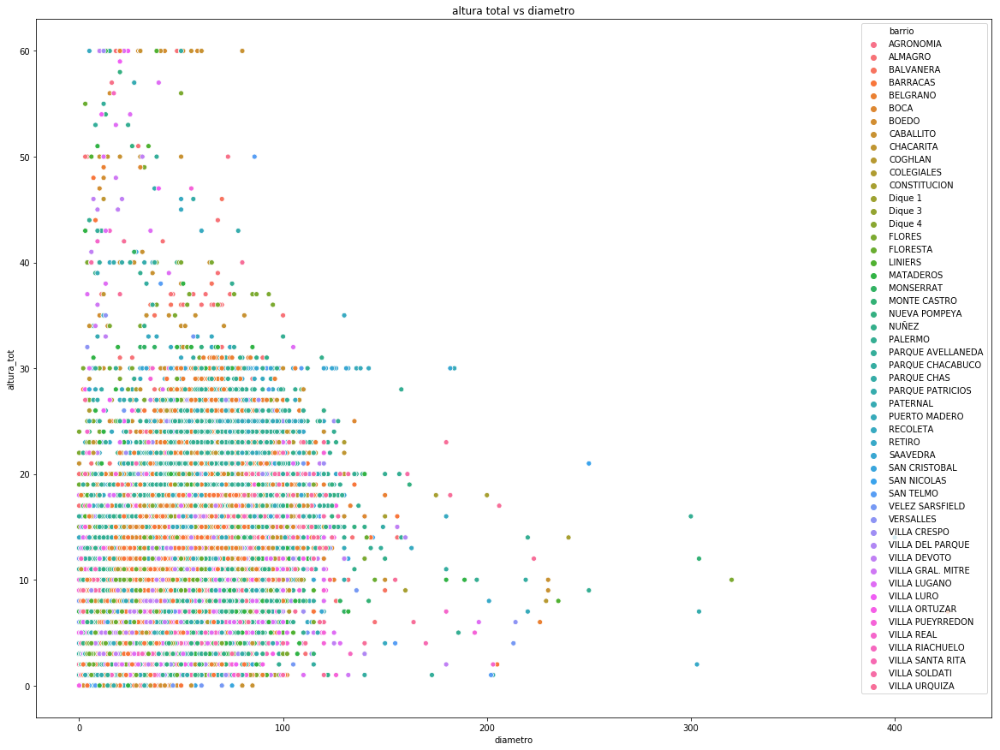

In [12]:
plt.figure(figsize=(20, 15))
sns.scatterplot(data = df, x="diametro", y="altura_tot", hue = 'barrio', y_jitter=15)
plt.title('altura total vs diametro');

# todos los arboles de mas de 40 m de altura tienen un diametro menor a 1 metro
# suponemos que algunos diametros estan expresados en metros y otros en cm, por eso el resultado es incongruente

**Nos fijamos la cantidad de árboles que no pudimos identificar**

In [13]:
df_no_id = df[( df['nombre_fam']== 'No identificada' ) | ( df['nombre_gen']== 'No identificada' ) |
   ( df['nombre_cie']== 'No Determinado' ) | ( df['nombre_com']== 'No Determinado' )]
print(df_no_id.shape[0], 'arboles no pudieron ser identificados')

6079 arboles no pudieron ser identificados


**Cambiamos los árboles que se encontraban en los diques 4, 3 y 1 a Puerto Madero**

In [14]:
print("Cantidad de barrios en CABA:", df.barrio.unique().shape[0])
df['barrio'].replace({'Dique 4':'PUERTO MADERO','Dique 3':'PUERTO MADERO','Dique 1':'PUERTO MADERO'},inplace=True)
print("Cantidad de barrios en CABA luego de reemplazar los diques por Puerto Madero:", df.barrio.unique().shape[0])

Cantidad de barrios en CABA: 51
Cantidad de barrios en CABA luego de reemplazar los diques por Puerto Madero: 48


In [15]:
# Lo chequeamos
df[df['barrio'] == 'Dique 1']

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2


**Veamos la distribución por familia de los árboles**

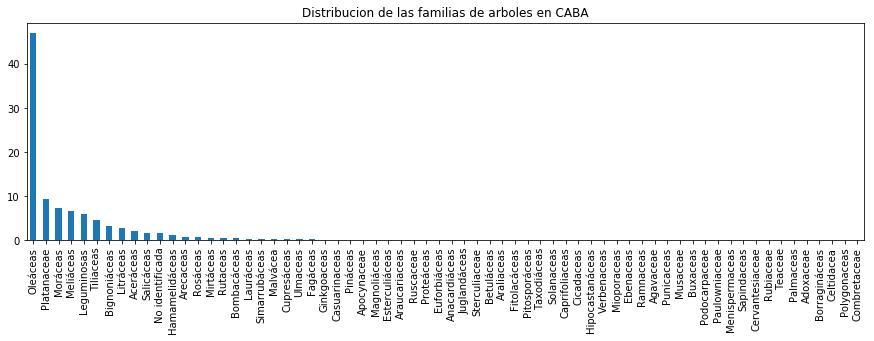

In [16]:
plot = (100 * df['nombre_fam'].value_counts(normalize = True)).plot(kind='bar', \
        title='Distribucion de las familias de arboles en CABA', figsize=(15, 4))

In [17]:
df.nombre_fam.value_counts(normalize=True).head()

Oleáceas       0.470211
Platanaceae    0.094317
Moráceas       0.072616
Meliáceas      0.066222
Leguminosas    0.059981
Name: nombre_fam, dtype: float64

Alrededor del 50% de los árboles pertenecen a la familia oleáceas seguido por la familia de los platanos.

In [18]:
arboles =df['nombre_com'].value_counts(normalize=True).iloc[:5].round(3)*100
print( 'Top 5 de árboles en CABA (%):')
print( arboles )

Top 5 de árboles en CABA (%):
Fresno americano    38.1
Plátano              9.3
Paraíso              6.6
Ficus                6.5
Tilo                 4.7
Name: nombre_com, dtype: float64


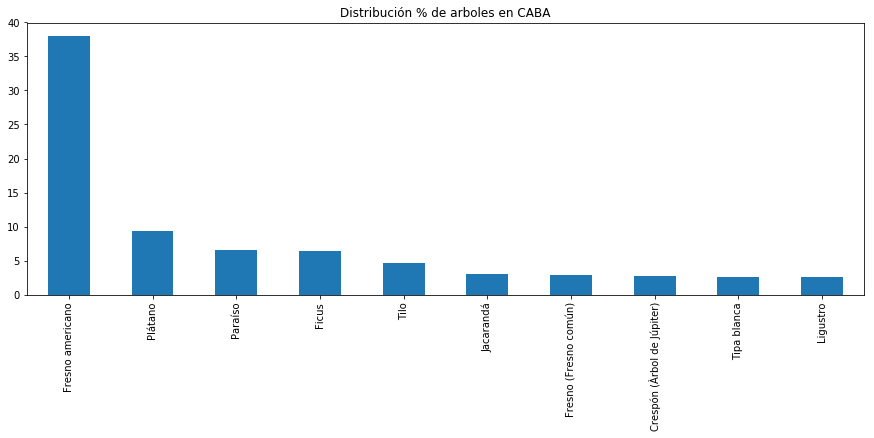

In [19]:
plot = (100 * df['nombre_com'].value_counts(normalize = True).head(10)).plot(kind='bar', \
        title='Distribución % de arboles en CABA', figsize=(15, 5))

**Removemos los árboles que tenian altura y diametro menor que 1.**

In [20]:
df.drop( df[ ( (df.altura_tot < 1) | (df.diametro < 1) ) ].index, inplace=True )

**Vemos la cantidad de árboles que hay de cada familia por barrio.**

In [21]:
df.groupby(['barrio', 'nombre_fam']).aggregate({'nombre_fam':'count'}).unstack()

nombre_fam                                                \
nombre_fam         Aceráceas Adoxaceae Agavaceae Anacardiáceas Apocynaceae   
barrio                                                                       
AGRONOMIA               30.0       NaN       NaN           NaN         4.0   
ALMAGRO                126.0       NaN       NaN           1.0        12.0   
BALVANERA              104.0       NaN       NaN           4.0         5.0   
BARRACAS               150.0       1.0       NaN           1.0        12.0   
BELGRANO               349.0       NaN       NaN           4.0        12.0   
BOCA                    78.0       NaN       NaN           NaN         3.0   
BOEDO                  268.0       NaN       NaN           NaN        21.0   
CABALLITO              421.0       1.0       NaN          11.0        40.0   
CHACARITA              114.0       NaN       NaN           3.0         2.0   
COGHLAN                 91.0       NaN       NaN           2.0         4.0   
COLEGIALES             150.0       NaN       NaN           1.0         3.0   
CONSTITUCION            32.0       NaN       NaN           NaN         3.0   
FLORES                 300.0       1.0       1.0           4.0        10.0   
FLORESTA               149.0       NaN       1.0           NaN         8.0   
LINIERS                279.0       NaN       NaN           3.0        25.0   
MATADEROS              493.0       NaN       NaN           9.0        36.0   
MONSERRAT                4.0       NaN       NaN           NaN         3.0   
MONTE CASTRO           203.0       NaN       NaN           2.0         8.0   
NUEVA POMPEYA          147.0       NaN       6.0           2.0        14.0   
NUÑEZ                  270.0       NaN       NaN           7.0         5.0   
PALERMO                517.0       NaN       NaN           5.0        14.0   
PARQUE AVELLANEDA      235.0       NaN       NaN           1.0         5.0   
PARQUE CHACABUCO       253.0       NaN       NaN           3.0        12.0   
PARQUE CHAS            118.0       NaN       NaN           NaN         7.0   
PARQUE PATRICIOS       130.0       NaN       NaN           2.0         5.0   
PATERNAL                86.0       NaN       NaN           3.0         NaN   
PUERTO MADERO            5.0       NaN       NaN           NaN         NaN   
RECOLETA               115.0       NaN       NaN           7.0         6.0   
RETIRO                  32.0       NaN       NaN           NaN         NaN   
SAAVEDRA               269.0       NaN       NaN          17.0        14.0   
SAN CRISTOBAL           69.0       NaN       NaN           NaN         9.0   
SAN NICOLAS              3.0       NaN       NaN           1.0         1.0   
SAN TELMO                5.0       NaN       NaN           NaN         1.0   
VELEZ SARSFIELD        122.0       NaN       NaN           1.0         8.0   
VERSALLES               79.0       NaN       NaN           2.0         4.0   
VILLA CRESPO           203.0       NaN       NaN           3.0        10.0   
VILLA DEL PARQUE        89.0       NaN       NaN           8.0         6.0   
VILLA DEVOTO           247.0       NaN       NaN           5.0        20.0   
VILLA GRAL. MITRE      111.0       NaN       NaN           2.0        14.0   
VILLA LUGANO           204.0       NaN       NaN           1.0        26.0   
VILLA LURO             175.0       NaN       NaN          10.0        11.0   
VILLA ORTUZAR          148.0       NaN       NaN           2.0         2.0   
VILLA PUEYRREDON       152.0       NaN       NaN           5.0         7.0   
VILLA REAL              87.0       NaN       NaN           1.0         4.0   
VILLA RIACHUELO         66.0       NaN       NaN           1.0         3.0   
VILLA SANTA RITA       153.0       NaN       NaN           2.0         8.0   
VILLA SOLDATI           30.0       NaN       NaN           1.0         2.0   
VILLA URQUIZA          379.0       NaN       NaN          17.0        14.0   

                                       

Podemos ver que algunas familias estan ampliamente distribuidas por los barrios, pero algunas otras (en Nan) no se distribuyen uniformemente

In [22]:
df[(df.nombre_fam == 'Borragináceas')]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
84128,-58.468287,-34.623229,Árbol,154043,12,55,0,84,Borragináceas,Patagonula,Patagonula americana,Guayaibi,Árbol Latifoliado Caducifolio,Nativo/Autóctono,65-066,FLORES,7,Bolivia,679,0
273101,-58.522787,-34.652776,Árbol,36002066,9,46,6,84,Borragináceas,Patagonula,Patagonula americana,Guayaibi,Árbol Latifoliado Caducifolio,Nativo/Autóctono,72-041,LINIERS,9,Garcia De Cossio,7326,0


Este árbol autóctono llamado Guayaibi esta representenado solo por __2 individuos en Flores y Liniers.__

**Ahora vemos la inclinación por barrio según el origen del árbol**

### Analisis de los no determinados en follaje y origen.
Veremos si tenemos el nombre o id_arbol capaz podemos recuperar información


In [23]:
pd.set_option("display.max_rows", 1000)


Vemos que árboles tenemos no determinados en origen y en el tipo de follaje


In [24]:
df_no_deter = df[( df['origen']== 'No Determinado' ) | ( df['tipo_folla']== 'No Determinado' ) ]
df_no_deter

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
128,-58.387135,-34.624613,Árbol,2571,1,2,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,14-028,CONSTITUCION,1,"Saenz Peña, Luis, Pres.",0,0
479,-58.391524,-34.600356,Árbol,2995,17,36,22,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,05-008,SAN NICOLAS,1,Rodriguez Peña,0,0
535,-58.388273,-34.596835,Árbol,3062,3,8,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,07-034,RECOLETA,2,Parana,1021,0
536,-58.388276,-34.596792,Árbol,3063,5,5,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,07-034,RECOLETA,2,Parana,1023,0
543,-58.387134,-34.596701,Árbol,3072,3,2,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,07-034,RECOLETA,2,Uruguay,1028,0
575,-58.403470,-34.598016,Árbol,3110,8,25,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,11-001,RECOLETA,2,Pueyrredon Av.,1053,0
585,-58.402180,-34.597878,Árbol,3122,4,7,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,11-001,RECOLETA,2,Larrea,900,0
593,-58.402396,-34.598515,Árbol,3130,2,2,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,11-001,RECOLETA,2,Larrea,832,0
702,-58.400989,-34.594305,Árbol,3255,2,2,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,11-005,RECOLETA,2,Larrea,1142,0
725,-58.400651,-34.592888,Árbol,3281,5,24,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,11-006,RECOLETA,2,Beruti,2426,0


Veamos por ejemplo, el árbol Acacia y si se puede recuperar información

In [25]:
df[(df.nombre_com == 'Acacia')]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
2567,-58.412964,-34.595545,Árbol,5398,6,12,12,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,15-042,RECOLETA,2,Gorriti,3413,0
2990,-58.410503,-34.594089,Árbol,5876,3,5,9,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,15-062,RECOLETA,2,Gallo,0,0
2996,-58.410931,-34.594862,Árbol,5882,5,10,8,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,15-062,RECOLETA,2,Gallo,0,0
2997,-58.410985,-34.594961,Árbol,5883,3,7,0,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,15-062,RECOLETA,2,Gallo,0,0
2998,-58.411138,-34.595237,Árbol,5884,5,10,0,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,15-062,RECOLETA,2,Gallo,0,0
17416,-58.424525,-34.599192,Árbol,22491,1,4,0,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,17-062,ALMAGRO,5,Rocamora,4264,0
17417,-58.424494,-34.599191,Árbol,22492,10,22,0,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,17-062,ALMAGRO,5,Rocamora,4264,0
21313,-58.479925,-34.562098,Árbol,26870,10,23,0,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,53-124,COGHLAN,12,Tronador,0,0
67208,-58.439656,-34.620496,Árbol,134846,10,18,40,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,40-041,CABALLITO,6,Rosario,772,0
88988,-58.482880,-34.549317,Árbol,161395,8,29,5,331,Leguminosas,Acacia,Acacia sp.,Acacia,No Determinado,No Determinado,43-048,SAAVEDRA,12,"Perez, Roque",4281,0


En el caso de Acacia no se puede recuperar ya que no existe información que la complete en ninguna de las filas.

En el caso del Tilo veamos si se puede recuperar ya que vemos que el tipo de follaje es "Árbol Latifoliado Caducifolio".

In [26]:
df[(df.nombre_com == 'Tilo') & ( df['tipo_folla'] != 'No Determinado' ) ]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
34,-58.388962,-34.619363,Árbol,2467,11,18,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Cevallos, Virrey",0,0
53,-58.388395,-34.624076,Árbol,2488,12,24,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,14-020,CONSTITUCION,1,"Cevallos, Virrey",1310,0
223,-58.391662,-34.612444,Árbol,2678,5,10,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,12-006,MONSERRAT,1,Entre Rios Av.,286,0
229,-58.391673,-34.612017,Árbol,2684,3,8,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,12-006,MONSERRAT,1,Entre Rios Av.,244,0
231,-58.391678,-34.611810,Árbol,2686,7,10,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,12-006,MONSERRAT,1,Entre Rios Av.,0,0
232,-58.391679,-34.611756,Árbol,2687,7,10,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,12-006,MONSERRAT,1,Entre Rios Av.,0,0
233,-58.391680,-34.611713,Árbol,2688,7,9,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,12-006,MONSERRAT,1,Entre Rios Av.,216,0
234,-58.391681,-34.611671,Árbol,2689,6,8,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,12-006,MONSERRAT,1,Entre Rios Av.,212,0
248,-58.391307,-34.611419,Árbol,2706,11,24,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,12-007,MONSERRAT,1,"Alsina, Adolfo",1777,0
423,-58.391533,-34.603057,Árbol,2929,20,33,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,05-006,SAN NICOLAS,1,Lavalle,1731,0


In [27]:
df[(df.nombre_com == 'Tilo') & ( df['tipo_folla'] == 'No Determinado' ) ]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
41509,-58.432087,-34.611744,Árbol,81116,5,24,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,45-128,CABALLITO,6,Avellaneda,124,0
95353,-58.476021,-34.577501,Árbol,168737,3,5,6,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,49-050,VILLA ORTUZAR,15,La Pampa,4728,0
114695,-58.462499,-34.599583,Árbol,2002386,3,10,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,59-103,PATERNAL,15,Maturin,2551,0
116104,-58.403635,-34.597458,Árbol,2003798,5,6,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,15-133,RECOLETA,2,Paraguay,0,0
116105,-58.403673,-34.597451,Árbol,2003799,6,7,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,15-133,RECOLETA,2,Paraguay,0,0
116108,-58.404042,-34.597387,Árbol,2003802,8,11,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,15-133,RECOLETA,2,Paraguay,2535,0
116117,-58.404820,-34.597251,Árbol,2003811,2,6,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,15-133,RECOLETA,2,Paraguay,2585,0
120090,-58.464275,-34.645218,Árbol,3003990,8,24,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,50-051,FLORES,7,Portela,0,0
120095,-58.464517,-34.645025,Árbol,3003995,10,31,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,50-051,FLORES,7,Portela,1214,0
120096,-58.464564,-34.644988,Árbol,3003996,10,26,0,371,Tiliaceas,Tilia,Tilia sp.,Tilo,No Determinado,Exótico,50-051,FLORES,7,Portela,1210,0


Si bien el nombre_com es el mismo, el id_especie nos delata que no pertenecen a la misma. Buscando información, Tilia viridis subsp. x moltkei es un hibrido del Tilo y si bien posiblemente tengan el mismo tipo de follaje,por las dudas no podemos asumirlo.

In [28]:
df[(df.nombre_com == 'Arce')]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
12412,-58.408619,-34.593713,Árbol,16884,8,14,0,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,15-103,RECOLETA,2,Aguero,1355,0
17692,-58.422952,-34.607049,Árbol,22797,10,42,0,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,17-068,ALMAGRO,5,"Acuña De Figueroa, Francisco",314,0
36708,-58.423843,-34.601418,Árbol,75749,8,40,5,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,17-072,ALMAGRO,5,Gascon,809,0
36713,-58.423763,-34.600864,Árbol,75754,8,49,0,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,17-072,ALMAGRO,5,Gascon,871,0
36715,-58.423743,-34.600726,Árbol,75756,9,49,0,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,17-072,ALMAGRO,5,Gascon,883,0
36716,-58.423728,-34.600622,Árbol,75757,7,52,0,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,17-072,ALMAGRO,5,Gascon,891,0
36717,-58.423720,-34.600568,Árbol,75758,9,38,0,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,17-072,ALMAGRO,5,Gascon,899,0
36768,-58.422768,-34.599300,Árbol,75813,7,71,5,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,17-073,ALMAGRO,5,Rocamora,4144,0
65564,-58.470981,-34.624875,Árbol,130859,3,5,9,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,65-035,FLORES,7,"Aranguren, Juan F., Dr.",2812,0
82708,-58.456860,-34.629804,Árbol,152407,4,5,0,333,Aceráceas,Acer,Acer sp.,Arce,No Determinado,Exótico,48-143,FLORES,7,"Alberdi, Juan Bautista Av.",2030,0


Tampoco se puede recuperar la información de follaje en el caso del Arce.

Veamos el caso del árbol __Viburnum__:

In [29]:
df[(df.nombre_com == 'Viburnum')]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
7518,-58.411704,-34.617998,Árbol,11312,4,12,5,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,28-027,BALVANERA,3,Agrelo,0,0
100338,-58.487489,-34.586057,Árbol,174714,3,8,0,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,61-151,PARQUE CHAS,15,De Los Constituyentes Av.,3905,0
149275,-58.360600,-34.635446,Árbol,8006086,4,8,0,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,06-028,BOCA,4,"Rodriguez, Martin",854,0
149276,-58.360641,-34.635379,Árbol,8006087,4,8,0,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,06-028,BOCA,4,"Rodriguez, Martin",832,0
178016,-58.507780,-34.668196,Árbol,15007211,6,37,0,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,76-013B,MATADEROS,9,Saladillo,2681,0
178038,-58.505546,-34.669879,Árbol,15007233,5,28,0,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,76-011,MATADEROS,9,Saladillo,2885,0
178108,-58.502293,-34.672212,Árbol,15007303,4,20,18,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,76-020,MATADEROS,9,Saladillo,3136,0
178149,-58.477930,-34.653606,Árbol,15007344,4,27,0,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,54-032B,PARQUE AVELLANEDA,9,Padre Montes Carballo,1640,0
218157,-58.426881,-34.593397,Árbol,26102616,3,9,0,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,19-012,PALERMO,14,Araoz,1327,0
218158,-58.426817,-34.593354,Árbol,26102617,3,10,0,429,Caprifoliaceas,Viburnum,Viburnum sp.,Viburnum,No Determinado,No Determinado,19-012,PALERMO,14,Araoz,1335,0


Caso del __Hibiscus__

In [30]:
df[(df.nombre_com == 'Hibiscus')]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
9039,-58.402103,-34.630725,Árbol,12996,4,8,5,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,24-057,PARQUE PATRICIOS,4,Catamarca,1734,0
25159,-58.426859,-34.600414,Árbol,31425,4,17,28,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,17-034,ALMAGRO,5,Pringles,986,0
25160,-58.426876,-34.600540,Árbol,31426,5,13,15,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,17-034,ALMAGRO,5,Pringles,978,0
30420,-58.410997,-34.628865,Árbol,68688,2,5,0,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,30-031,SAN CRISTOBAL,3,Danel,1497,0
40443,-58.423724,-34.636103,Árbol,79924,3,12,0,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,38-137,BOEDO,5,Las Casas,4145,0
49992,-58.416950,-34.617077,Árbol,94167,8,25,12,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,36-133,ALMAGRO,5,Boedo Av.,373,0
51686,-58.399712,-34.637161,Árbol,100758,4,20,0,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,24-051,PARQUE PATRICIOS,4,Patagones,2679,0
51719,-58.398920,-34.636185,Árbol,100794,2,5,0,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,24-051,PARQUE PATRICIOS,4,Colonia Av.,25,0
120254,-58.480076,-34.650482,Árbol,3004155,4,6,4,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,54-035,PARQUE AVELLANEDA,9,"Bilbao, Francisco",4433,0
126486,-58.478115,-34.682119,Árbol,4103858,4,16,0,349,Malvácea,Hibiscus,Hibiscus sp.,Hibiscus,No Determinado,No Determinado,80-055,VILLA LUGANO,8,"Batlle Y Ordoñez, Jose P.T.",6241,0


Como fueron varios los casos de arboles en que esta información esta incompleta y no se puede recuperar, asumimos que es lo que ocurre para todos los casos "no determinados". 

Observación de algunas métricas 

In [31]:
df.pivot_table(index='nombre_com', aggfunc={'nombre_com':('count'),'altura_tot':('median'),\
                                           'inclinacio':('median'),\
                                           'diametro':('median')})

,altura_tot,diametro,inclinacio,nombre_com
nombre_com,,,,
Abedul blanco,7.0,21.0,0.0,13
Abedul común (Abedul de Europa o Abedul verrugoso),6.0,14.0,0.0,75
Abutilo,6.0,22.0,0.0,150
Acacia,6.0,25.0,0.0,870
Acacia blanca,7.0,26.0,0.0,1722
Acacia bola,6.0,23.0,0.0,1140
Acacia de Baile (Mimosa de Baile),5.0,17.0,0.0,290
Acacia de constantinopla,3.0,9.0,0.0,1220
Acacia del Japón,5.0,20.0,0.0,5


En la tabla anterior mostramos para cada árbol cual es la __suma de cada uno__ y la __mediana de la altura__, la __inclinación__ y el __diámetro__.

**Chequeamos la dirección que hay valores de chapa en 0**

In [32]:
df[df['chapa1']== 0]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
3,-58.389525,-34.620052,Árbol,2433,9,17,0,7,Aceráceas,Acer,Acer negundo,Arce negundo,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Calvo, Carlos",0,0
6,-58.389739,-34.620064,Árbol,2436,17,43,10,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Calvo, Carlos",0,0
8,-58.389913,-34.620074,Árbol,2438,6,17,21,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Calvo, Carlos",0,0
11,-58.390174,-34.619826,Árbol,2442,5,9,0,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,Solis,0,0
21,-58.390132,-34.619017,Árbol,2453,13,35,0,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,Estados Unidos,0,0
32,-58.388972,-34.619205,Árbol,2465,7,20,9,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Cevallos, Virrey",0,0
33,-58.388967,-34.619277,Árbol,2466,14,29,10,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Cevallos, Virrey",0,0
34,-58.388962,-34.619363,Árbol,2467,11,18,0,4,Tiliaceas,Tilia,Tilia viridis subsp. x moltkei,Tilo,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Cevallos, Virrey",0,0
35,-58.388949,-34.619562,Árbol,2468,11,26,16,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-017,CONSTITUCION,1,"Cevallos, Virrey",0,0
36,-58.388938,-34.619734,Árbol,2469,10,33,0,6,Moráceas,Ficus,Ficus benjamina,Ficus,Árbol Latifoliado Perenne,Exótico,14-017,CONSTITUCION,1,"Cevallos, Virrey",0,0


En chapa1 hay 109003 valores en 0, pero tal vez en chapa 2 esta completo. Chequeemos eso.

In [33]:
df[(df['chapa1']== 0) & (df['chapa2'] != 0)]

,long,lat,tipo_sitio,id_arbol,altura_tot,diametro,inclinacio,id_especie,nombre_fam,nombre_gen,nombre_cie,nombre_com,tipo_folla,origen,codigo_man,barrio,comuna,calle,chapa1,chapa2
219,-58.391222,-34.612570,Árbol,2673,4,4,0,8,Litráceas,Lagerstroemia,Lagerstroemia indica,Crespón (Àrbol de Júpiter),Árbol Latifoliado Caducifolio,Exótico,12-006,MONSERRAT,1,Moreno,0,1773
2075,-58.394681,-34.595400,Árbol,4842,9,18,0,6,Moráceas,Ficus,Ficus benjamina,Ficus,Árbol Latifoliado Perenne,Exótico,11-072,RECOLETA,2,Riobamba,0,1124
4677,-58.395168,-34.606152,Árbol,7870,7,15,0,5,Oleáceas,Ligustrum,Ligustrum lucidum for. aureo-variegatum,Ligustro disciplinado (Ligustro variegado),Árbol Latifoliado Perenne,Exótico,09-060,BALVANERA,3,Ayacucho,0,282
6183,-58.399397,-34.614226,Árbol,9624,11,56,0,999,No identificada,No identificado,No Determinable,No Determinable,No Determinado,No Determinado,20-031,BALVANERA,3,Belgrano Av.,0,2355
6774,-58.396082,-34.614613,Árbol,10308,12,43,0,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,20-054,BALVANERA,3,Rincon,0,490
6810,-58.395738,-34.614018,Árbol,10347,26,38,14,2,Platanaceae,Platanus,Platanus x acerifolia,Plátano,Árbol Latifoliado Caducifolio,Exótico,20-055,BALVANERA,3,Belgrano Av.,0,2079
7193,-58.393350,-34.612264,Árbol,10814,12,26,17,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,20-064,BALVANERA,3,Combate De Los Pozos,0,261
10105,-58.477107,-34.556634,Árbol,14186,6,28,0,6,Moráceas,Ficus,Ficus benjamina,Ficus,Árbol Latifoliado Perenne,Exótico,41-043,COGHLAN,12,Azurduy Juana,0,3594
10780,-58.389078,-34.618838,Árbol,14968,9,23,0,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-018,CONSTITUCION,1,Estados Unidos,0,1609
10801,-58.388991,-34.618525,Árbol,14992,8,22,5,1,Oleáceas,Fraxinus,Fraxinus pennsylvanica,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,14-018,CONSTITUCION,1,"Cevallos, Virrey",0,869


Tenemos 267 valores de chapa 1 que podemos rescatar de chapa 2.

In [34]:
df.chapa1 = df.apply(lambda x: x.chapa2 if (x.chapa1== 0) & (x.chapa2 != 0) else x.chapa1 ,axis=1)

In [35]:
df_mini=df.iloc[:,4:7].describe().round(2)
print("Descripción de los datos cuantitativos:\n\n",df_mini)

Descripción de los datos cuantitativos:

        altura_tot   diametro  inclinacio
count   372259.00  372259.00   372259.00
mean         8.48      31.97        3.07
std          4.57      20.19        6.03
min          1.00       1.00        0.00
25%          5.00      17.00        0.00
50%          8.00      28.00        0.00
75%         11.00      43.00        5.00
max         60.00     426.00       60.00


En promedio, los árboles de la Ciudad de Buenos Aires tienen una altura de 8.48 m, un diámetro de 31.97 cm y una inclinación de 3.07, con valores máximos de 60 m, 426 cm y 60 respectivamente.

Procedemos a la eliminación de algunas columnas que no nos son necesarias para el análisis. 

In [36]:
df.drop(['tipo_sitio', 'id_arbol', 'id_especie', 'nombre_gen', 
        'nombre_cie', 'codigo_man', 'chapa1', 'chapa2'], axis=1, inplace=True)

Modificamos los nombres de las columnas para que sean más entendibles. 

In [37]:
df = df.rename(columns={'inclinacio': 'inclinacion','nombre_com': 'nombre_comun', 'tipo_folla': 'follaje',
                       'altura_tot': 'altura_total'})
df.sample(2)

,long,lat,altura_total,diametro,inclinacion,nombre_fam,nombre_comun,follaje,origen,barrio,comuna,calle
341477,-58.422571,-34.582282,9,24,0,Oleáceas,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,PALERMO,14,Guemes
17453,-58.425054,-34.598973,3,4,0,Cupresáceas,Ciprés,Árbol Conífero Perenne,Exótico,ALMAGRO,5,Palestina


No tenemos muchas features, pero _¿se verá alguna correlación?_

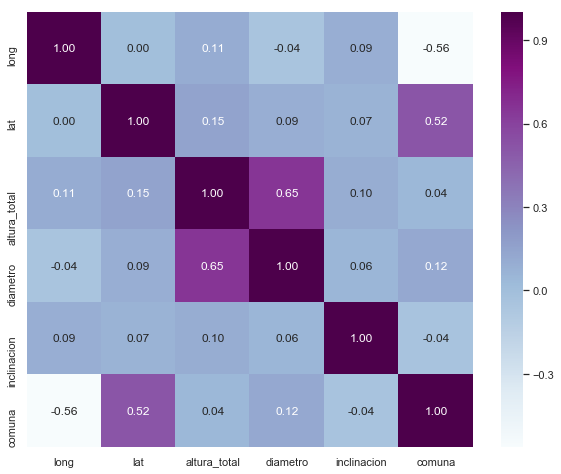

In [38]:
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = (10, 8)
sns.set(font_scale=1)
sns.heatmap(df.corr(), annot=True, fmt='.2f', cmap="BuPu");

Como era de esperarse, no podemos decir mucho. El diámetro se correlaciona fuertemente con la altura de los árboles. Por otro lado, vemos que le diámetro se correlaciona muy poco con la inclinación. Por lo tanto, un árbol más alto no tiene porque estar inclinado.

**Graficamos el promedio de la inclinación por barrio**

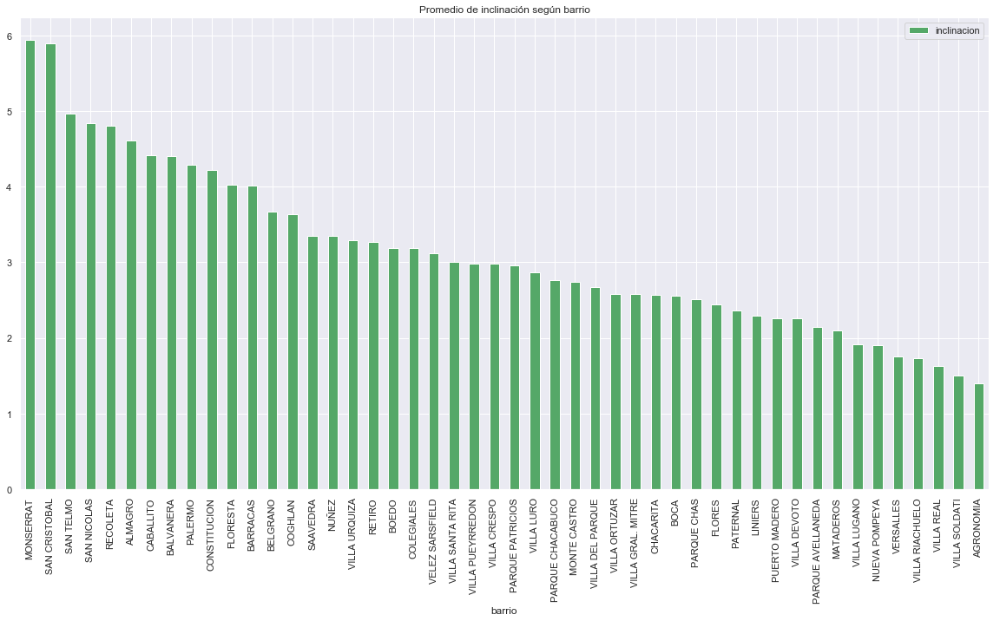

In [39]:
incli_barrio = df.groupby(df['barrio'])[['inclinacion']].mean().sort_values(by='inclinacion', ascending=False)
incli_barrio.plot(kind='bar', color='g', figsize=(20,10), title='Promedio de inclinación según barrio')

Monserrat y San Cristobal presentan los árboles con mayor inclinación de la ciudad. Esta zona es historica y antigua y tal vez con veredas no preparadas para árboles. Le siguen en orden San Telmo, San Nicolás no muy lejos de estas zonas.  

**Analicemos un poco mejor los datos descriptivos cuantitativos de los árboles, su altura total, diámetro e inclinación.**

Los árboles mas altos de la ciudad tienen 60 mts y hay mínimos de cero que limpiamos previamente. El mayor diámetro es de 426cm. Probablemente este mal medido. La mediana de la altura es 8m, 28 cm de diámetro y nada de inclinación. 
Otro dato interesante es que el 75% de los árboles tiene 5 o menos de inclinación, por lo que estarían lejos de estar en riesgo de caerse. Sin embargo hay un valor 60 que es bastante alto. Se considera un árbol en riesgo de caida cuando supera los 45 grados. Vamos a analizar esta información con mayor profundidad más adelante. Ahora enfoquemonos en la altura:

In [40]:
arboles_altos= df[df['altura_total']== 60].sort_values(by='origen', ascending=False)
print("Cantidad de árboles de 60 m de altura:", arboles_altos.shape[0])

Cantidad de árboles de 60 m de altura: 71


In [41]:
#Chequeo si dentro de los mas altos alguno tiene una inclinación peligrosa 
df[(df['altura_total']== 60) & (df['inclinacion'] >= 45)]

,long,lat,altura_total,diametro,inclinacion,nombre_fam,nombre_comun,follaje,origen,barrio,comuna,calle


Hay 71 árboles de 60 mts de altura y ninguno tiene una inclinación peligrosa. Por lo que verificamos que no habría correlación entre altura e inclinación.

In [42]:
#De curiosidad, veremos el caso del valor max a 426m.
df[(df.diametro == 426)]

,long,lat,altura_total,diametro,inclinacion,nombre_fam,nombre_comun,follaje,origen,barrio,comuna,calle
33689,-58.377817,-34.640933,7,426,0,Salicáceas,Sauce llorón,Árbol Latifoliado Caducifolio,Exótico,BARRACAS,4,Suarez Av.


El árbol con mayor diámetro es un sauce llorón en Barracas y sin valor de chapa. 

**Observamos las alturas totales en los distintos barrios con un boxplot**

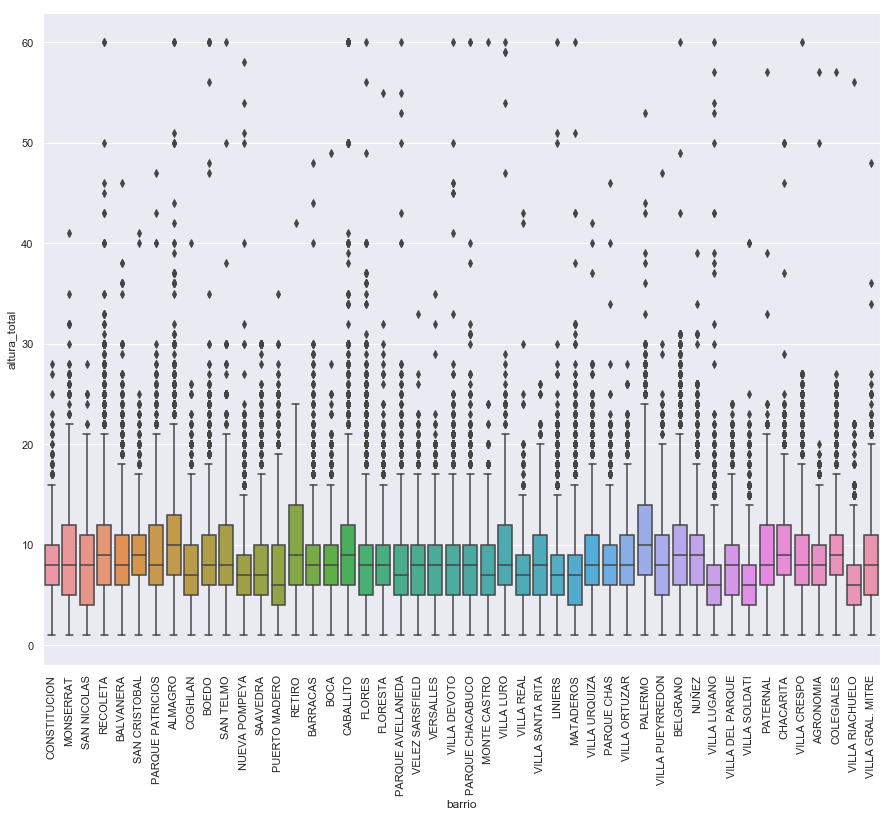

In [43]:
plt.figure(figsize=(15,12))
ax = sns.boxplot(x="barrio", y="altura_total", data=df)
for item in ax.get_xticklabels():
    item.set_rotation(90)

En el grafico podemos ver que la mediana de la altura en los distintos barrios no difiere demasiado. 
Villa Lugano, Villa Soldati y Villa Riachuelo son los que tienen arboles mas bajos. Coghland y Palermo los mas altos.


**Vemos la distribución que tienen los árboles por altura en CABA**

count    372259.000000
mean          8.478334
std           4.573150
min           1.000000
25%           5.000000
50%           8.000000
75%          11.000000
max          60.000000
Name: altura_total, dtype: float64


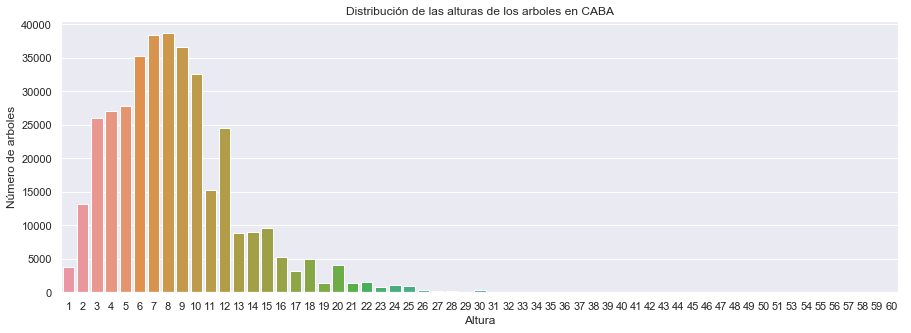

In [44]:
print(df['altura_total'].describe())

plt.figure(figsize=(15,5))
sns.countplot(df['altura_total'])
plt.title('Distribución de las alturas de los arboles en CABA')
plt.xlabel('Altura')
plt.ylabel('Número de arboles')
plt.show()


Observamos que mayormente los arboles de la ciudad rondan entre 6 y 10 mts.

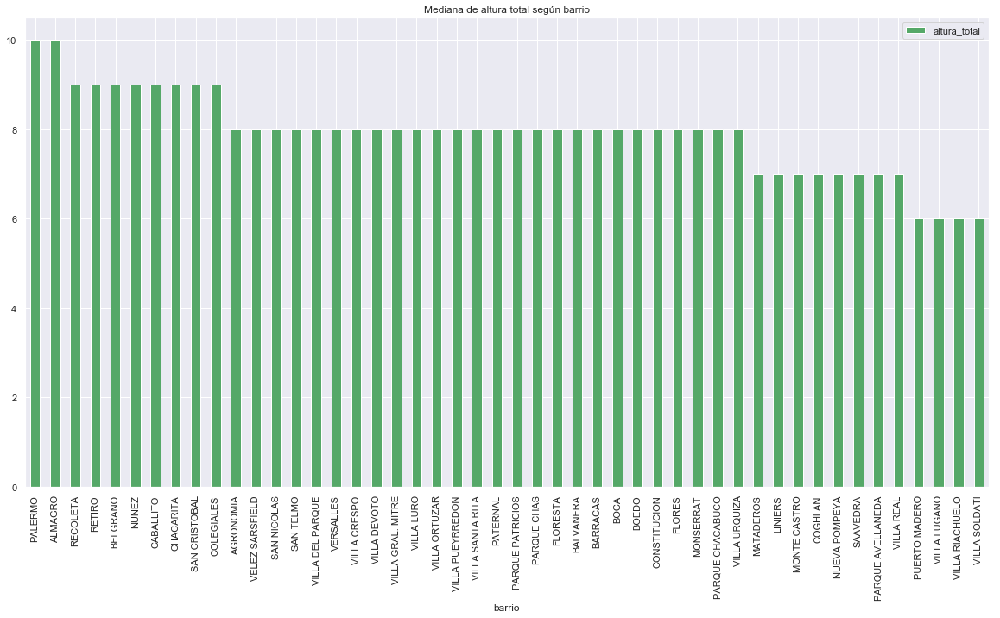

In [45]:
altos_x_barrio = df.groupby(df['barrio'])[['altura_total']].median().sort_values(by='altura_total', ascending=False)
altos_x_barrio.plot(kind='bar', color='g',figsize=(20,10), title='Mediana de altura total según barrio')

Mayores alturas de árboles se encuentra en Palermo y Almagro y las de menos en VIlla Soldati y Villa Riachuelo.

In [46]:
df.groupby('nombre_comun').mean()['altura_total'].sort_values(ascending = False)

nombre_comun
Afrocarpus                                                 20.600000
Esterculea                                                 20.000000
Eucalipto                                                  19.045455
Eucalipto tereticornis                                     17.000000
Palo coca                                                  15.455882
Plátano                                                    15.078136
Cedro del Líbano  (Cedro de Salomón)                       15.000000
Tipa blanca                                                14.730089
Robusta                                                    13.842105
Eucalipto (Eucalipto común)                                12.800000
Ciprés funerario                                           12.000000
Paulonia (Árbol de la emperatriz)                          12.000000
Palo amarillo                                              12.000000
Cedro del Atlas (Cedro plateado o Cedro atlántico)         11.440000
Eucalipto saligna    

**Análisis de la inclinación**

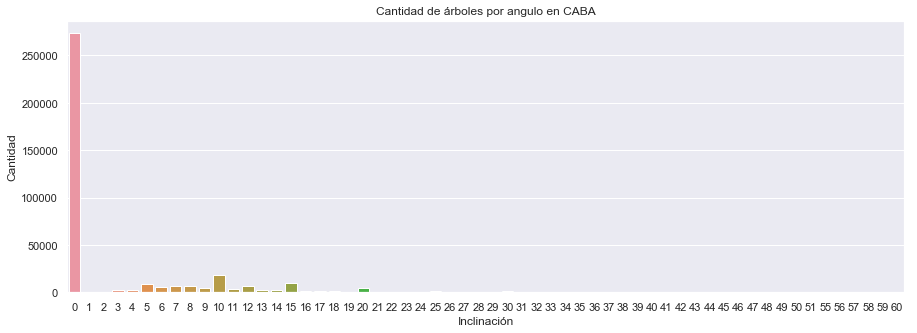

In [47]:
plt.figure(figsize=(15,5))
sns.countplot(df['inclinacion'])
plt.title('Cantidad de árboles por angulo en CABA')
plt.xlabel('Inclinación')
plt.ylabel('Cantidad')
plt.show()


Podemos observar como la mayoría de los árboles se encuentran en un angulo de 0 y no tienen inclinación peligrosa.

Hagamos un zoom en aquellos que pueden ser peligrosos por su ángulo de inclinación.

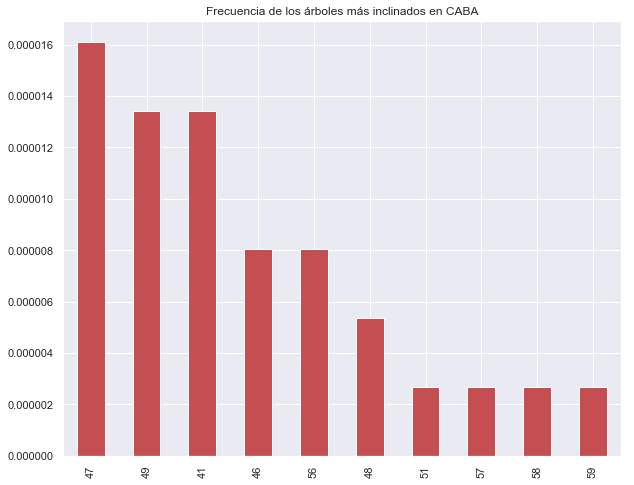

In [48]:
plt.title('Frecuencia de los árboles más inclinados en CABA')
df['inclinacion'].value_counts(normalize=True).tail(10).plot.bar(color='r')

Analizamos la cantidad de arboles con una inclinación peligrosa.

Text(0, 0.5, 'Cantidad')

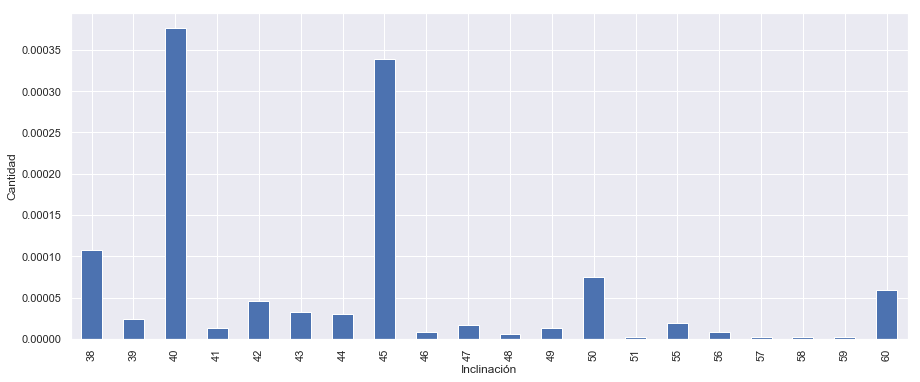

In [49]:
plt.figure(figsize=(15,6))
df['inclinacion'].value_counts(normalize = True).sort_index().tail(20).plot.bar()
plt.xlabel('Inclinación')
plt.ylabel('Cantidad')

SI bien la proporción de árboles en angulo peligroso es bastante baja, es importante poder identificarlos y verficar si han traído inconvenientes y pueden ser removidos.

¿De qué especie son los árboles mas inclinados?

In [50]:
df_incli =df[df['inclinacion'] >=45][['barrio', 'nombre_comun', 'inclinacion']].\
            sort_values(by='inclinacion', ascending=False)

In [51]:
df_incli 

,barrio,nombre_comun,inclinacion
371653,NUEVA POMPEYA,No Determinable,60
183088,VILLA LUGANO,No Determinable,60
19161,ALMAGRO,Fresno americano,60
39725,BOEDO,Fresno americano,60
62170,CABALLITO,Fresno americano,60
66297,PARQUE AVELLANEDA,Sófora japónica,60
84207,FLORES,No Determinable,60
13273,RECOLETA,Fresno americano,60
144902,VILLA DEL PARQUE,Paraíso,60
183087,VILLA LUGANO,No Determinable,60


In [52]:
df_incli_nombres=pd.DataFrame(df_incli['nombre_comun'].value_counts(normalize=True).head(10))
df_incli_nombres

,nombre_comun
Fresno americano,0.242718
Jacarandá,0.150485
Paraíso,0.063107
No Determinable,0.053398
Tipa blanca,0.048544
Ligustro disciplinado (Ligustro variegado),0.029126
Fresno (Fresno común),0.029126
"Visco (Viscote, Arca)",0.024272
Pata de vaca (Pezuña de vaca),0.019417
Sauce llorón,0.019417


Los árboles más inclinados son en su mayoría No determinables,  Fresno americano, Jacaranda, Paraiso 

**¿En qué barrio encontramos los arboles más inclinados?**

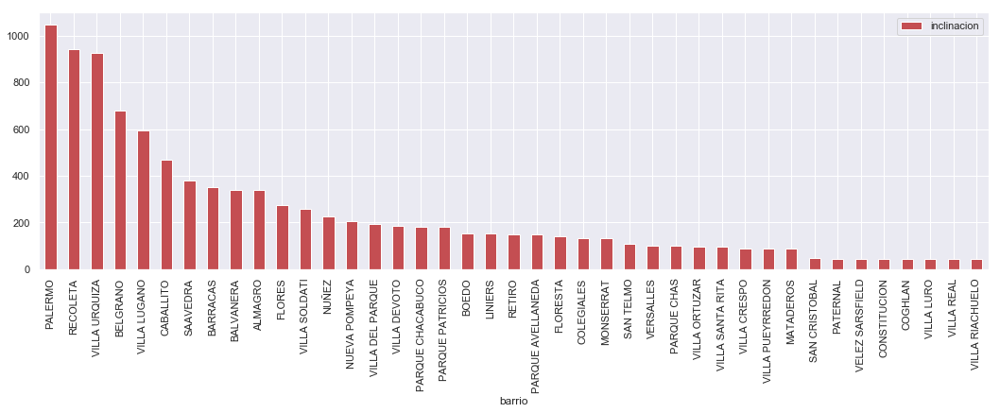

In [53]:
inclinacion_x_barrio = df_incli.groupby(df_incli['barrio'])\
                    [['inclinacion']].sum().sort_values(by='inclinacion', ascending=False)# no esta bien poner SUM
inclinacion_x_barrio.plot(kind='bar', color='r', figsize=(18,5))

Las inclinaciónes más altas se encuentran en Palermo, Villa Urquiza y Recoleta

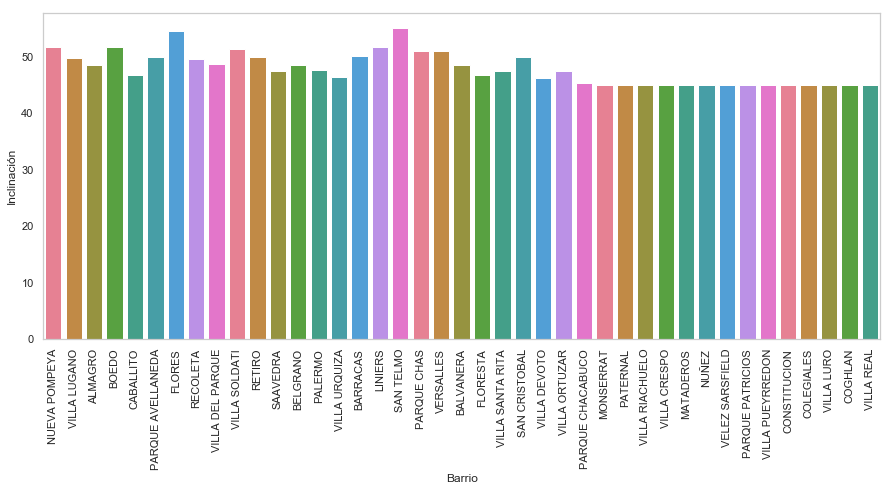

In [54]:
#inclinacion por barrio
plt.figure(figsize=(15,6))
sns.set_style("whitegrid", {'axes.grid' : False})
ax = sns.barplot(x="barrio", y="inclinacion", data=df_incli, palette=sns.color_palette("husl", 9), ci=None)
ax.set_title("")
ax.set_ylabel('Inclinación')
ax.set_xlabel('Barrio')
for item in ax.get_xticklabels():
    item.set_rotation(90)

A continuación vemos la distribución de árboles según su origen

In [55]:
import plotly
from plotly import __version__
print (__version__)
import plotly.plotly as py
import plotly.tools as tls
from plotly.graph_objs import *
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
pyo.init_notebook_mode()


3.7.1


In [56]:
origen_valores=df['origen'].value_counts(normalize=True)
grupos = ['Exótico','Nativo', 'no determinado']
colores = ['teal', 'aquamarine', 'aqua']

piee = go.Pie(labels=grupos, values=origen_valores,
               hoverinfo='label+percent', textinfo='value', 
               textfont=dict(size=14),
               marker=dict(colors=colores, 
                           line=dict(color='#000000', width=2)))

#ploteamos 
iplot([piee])

Observamos que la gran mayoría de los árboles, casi el 90%, son exóticos.

In [57]:
origen_valores=df['follaje'].value_counts(normalize=True)
grupos = ['Árbol Latifoliado Caducifolio', 'Árbol Latifoliado Perenne', 'No Determinado',
          'Palmera','Árbol Conífero Perenne', 'Arbusto Perenne', 'Arbusto o Herbacea', 'Arbusto Caducifolio', 
          'Árbol Conífero Caducifolio', 'Miscelaneo']
colores = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf"]

piee = go.Pie(labels=grupos, values=origen_valores,
               hoverinfo='label+percent', textinfo='value', 
               textfont=dict(size=14),
               marker=dict(colors=colores, 
                           line=dict(color='#000000', width=1)))

#ploteamos 
iplot([piee])

Un poco de interpretación: Un árbol caducifolio o de hoja caduca es el que pierde las hojas durante algún período del año.  
Perenne: Estas especies mantienen su follaje en las estaciones frías

In [58]:
df.groupby('barrio')["altura_total"].aggregate([min, np.mean, np.median, max]).round(2)

,min,mean,median,max
barrio,,,,
AGRONOMIA,1,8.44,8,57
ALMAGRO,1,10.38,10,60
BALVANERA,1,8.53,8,46
BARRACAS,1,8.43,8,48
BELGRANO,1,9.94,9,60
BOCA,1,8.32,8,49
BOEDO,1,8.70,8,60
CABALLITO,1,9.38,9,60
CHACARITA,1,9.69,9,50


EL dataframe anterior nos muestra, por barrio, distinta información de la altura total como el mínimo, el máximo, la media y la mediana. <BR> Tenemos a Palermo con la media de altura total mas alta y por el otro lado, en Villa Riachuelo, esta la media de la altura total más baja. 

### Vamos a calcular la cantidad de árboles por área. Para esto importamos el dataset de barrios. 

In [59]:
barrios = pd.read_csv("barrios.csv", encoding='latin1')
barrios.shape

(48, 5)

In [60]:
nombre_count= df['nombre_comun'].value_counts()
z1 = nombre_count.to_dict() 
barrios['nombre_com']= barrios['BARRIO'].map(z1) 
barrios[barrios['BARRIO']== 'BOCA']

,WKT,BARRIO,COMUNA,PERIMETRO,AREA,nombre_com
47,"POLYGON ((-58.3552004576535 -34.6194307028365,-58.3551397746524 -34.619550451567,-58.3542493044198 -34.6194639606184,-58.3540734427267 -34.6197013641177,-58.3539132658717 -34.6196160200227,-58.353...",BOCA,4.0,20595.90146,5.028581e+06,NaN


In [61]:
barrio_count  = df['barrio'].value_counts()
z1 = barrio_count.to_dict() 
barrios['arboles'] = barrios['BARRIO'].map(z1) 
barrios[barrios['BARRIO']== 'BOCA']

,WKT,BARRIO,COMUNA,PERIMETRO,AREA,nombre_com,arboles
47,"POLYGON ((-58.3552004576535 -34.6194307028365,-58.3551397746524 -34.619550451567,-58.3542493044198 -34.6194639606184,-58.3540734427267 -34.6197013641177,-58.3539132658717 -34.6196160200227,-58.353...",BOCA,4.0,20595.90146,5.028581e+06,NaN,5473


El área parece estar en m2, para mayor comodidad lo paso a km2 y genero una nueva columna de cuantos árboles hay por área.

__Feature engineering__: creamos una nueva columna de densidad  (expresada en área por km2) 

In [62]:
barrios['AREA_KM2'] = barrios['AREA'] * 0.000001
barrios['Densidad'] = barrios['arboles']/ barrios['AREA_KM2']
barrios_grafico = barrios[['BARRIO','AREA_KM2', 'arboles', 'Densidad']].sort_values(by='Densidad',\
                                                                                          ascending=False)

In [63]:
display(barrios_grafico.head(10))
display(barrios_grafico.tail(10))

,BARRIO,AREA_KM2,arboles,Densidad
26,PARQUE CHAS,1.385412,4504,3251.019611
21,COGHLAN,1.279951,3751,2930.580083
8,VILLA REAL,1.334146,3885,2911.974970
39,VERSALLES,1.406834,4024,2860.324072
7,MONTE CASTRO,2.627481,7416,2822.474866
6,VILLA SANTA RITA,2.153691,5923,2750.162634
37,VILLA DEVOTO,6.404481,17535,2737.926836
23,COLEGIALES,2.289774,6089,2659.214282
22,VILLA URQUIZA,5.449059,14490,2659.174769
10,FLORESTA,2.320641,6093,2625.567976


,BARRIO,AREA_KM2,arboles,Densidad
44,RECOLETA,6.140873,8045,1310.074255
29,BARRACAS,7.961000,10105,1269.312930
34,VILLA RIACHUELO,4.232874,5094,1203.437750
19,SAN TELMO,1.232275,1378,1118.256799
47,BOCA,5.028581,5473,1088.378703
41,MONSERRAT,2.198622,2018,917.847658
35,VILLA SOLDATI,8.663595,5856,675.931909
45,RETIRO,4.534476,2496,550.449497
40,PUERTO MADERO,5.027425,2454,488.122657
42,SAN NICOLAS,2.289008,986,430.754362


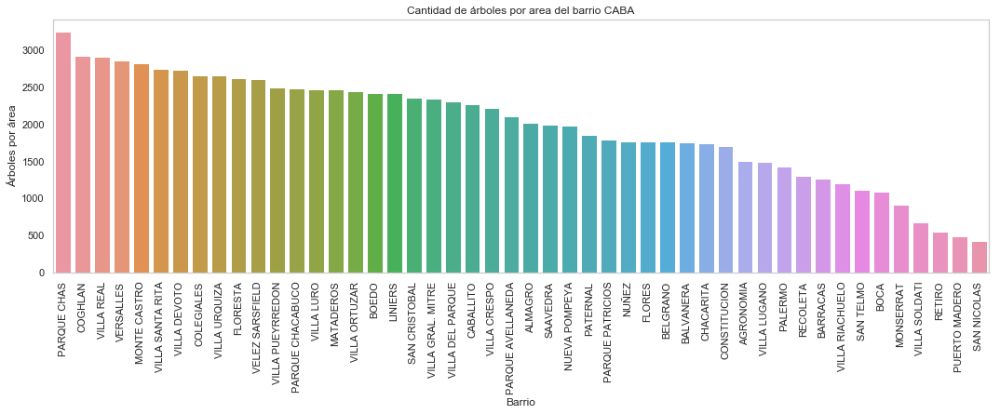

In [64]:
plt.figure(figsize=(18,5))
plt.rcParams['font.family'] = 'Arial'
sns.set_style("whitegrid", {'axes.grid' : False})
a = sns.barplot(x='BARRIO', y='Densidad', data=barrios_grafico)
a.set_xticklabels(a.get_xticklabels(), rotation=90)
plt.title('Cantidad de árboles por area del barrio CABA')
plt.ylabel('Árboles por área', fontsize=12)
plt.xlabel('Barrio', fontsize=12)
plt.show()

De esta manera podemos ver que el barrio con mayor cantidad de árboles por área es Parque Chas seguido por Coghlan. San Nicolas es el que tiene menor cantidad de árboles seguido por Puerto Madero. Este ultimo tiene sentido ya que gran parte del area esta cubierto por el río en el medio. Es una zona con mucho tránsito y en la que podría considerarse plantar mayor cantidad de árboles.

Debido a que no tenemos información de si el árbol es joven o adulto, no podemos inferir una altura promedio o diámetro promedio.


In [65]:
df.columns

Index(['long', 'lat', 'altura_total', 'diametro', 'inclinacion', 'nombre_fam',
       'nombre_comun', 'follaje', 'origen', 'barrio', 'comuna', 'calle'],
      dtype='object')

In [66]:
df['geometry'] = list(zip(df['long'],df['lat']))
df['geometry'] = df['geometry'].apply(Point)
df_mapa = gpd.GeoDataFrame(df, geometry='geometry')
df_mapa.crs = {'init' :'epsg:4326'}
df_mapa.head()

,long,lat,altura_total,diametro,inclinacion,nombre_fam,nombre_comun,follaje,origen,barrio,comuna,calle,geometry
0,-58.389059,-34.620026,7,20,17,Oleáceas,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,CONSTITUCION,1,"Calvo, Carlos",POINT (-58.3890587967 -34.6200256156)
1,-58.389211,-34.620034,8,33,16,Oleáceas,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,CONSTITUCION,1,"Calvo, Carlos",POINT (-58.3892113317 -34.6200342718)
2,-58.389269,-34.620037,2,3,0,Oleáceas,Ligustro,Árbol Latifoliado Perenne,Exótico,CONSTITUCION,1,"Calvo, Carlos",POINT (-58.38926879140001 -34.6200374616)
3,-58.389525,-34.620052,9,17,0,Aceráceas,Arce negundo,Árbol Latifoliado Caducifolio,Exótico,CONSTITUCION,1,"Calvo, Carlos",POINT (-58.3895252334 -34.6200520397)
4,-58.389608,-34.620057,6,13,14,Oleáceas,Fresno americano,Árbol Latifoliado Caducifolio,Exótico,CONSTITUCION,1,"Calvo, Carlos",POINT (-58.3896077703 -34.6200566868)


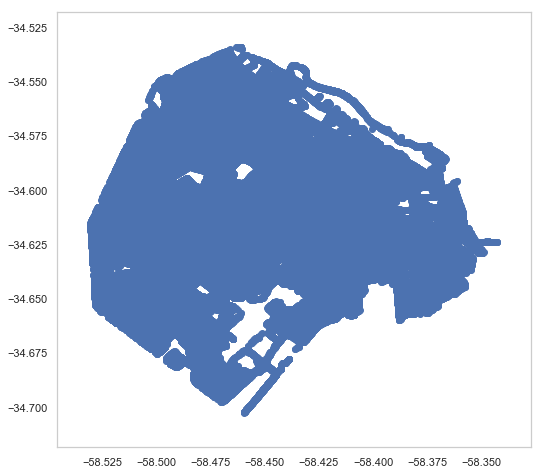

In [67]:
df_mapa.plot()

Solo algunas pocas regiones no estan cubiertas por arbolado lineal pero puede ser que sean areas de parques, o por ejemplo aeroparque

In [68]:
def from_wkt(df, wkt_column):
    import shapely.wkt
    df["coordinates"]= df[wkt_column].apply(shapely.wkt.loads)
    gdf = gpd.GeoDataFrame(barrios, geometry='coordinates')
    return gdf

In [69]:
barrios

,WKT,BARRIO,COMUNA,PERIMETRO,AREA,nombre_com,arboles,AREA_KM2,Densidad
0,"POLYGON ((-58.4528200492791 -34.5959886570639,-58.453655193137 -34.5965557163041,-58.4537674321647 -34.5966342484152,-58.4538163134148 -34.5966684788922,-58.4547947928051 -34.5973527273644,-58.455...",CHACARITA,15.0,7725.695228,3.118101e+06,NaN,5426,3.118101,1740.161736
1,"POLYGON ((-58.4655768128541 -34.5965577078058,-58.4656201094845 -34.5967043067336,-58.4655402165487 -34.5966463016308,-58.4654505835153 -34.59661891152,-58.465339885911 -34.5966119403979,-58.46527...",PATERNAL,15.0,7087.513295,2.229829e+06,NaN,4150,2.229829,1861.129233
2,"POLYGON ((-58.4237529813037 -34.5978273383243,-58.4249540814512 -34.5978518131509,-58.4263027567354 -34.5978820110739,-58.4264393571481 -34.5978996596333,-58.4265647997241 -34.5979158245663,-58.42...",VILLA CRESPO,15.0,8132.699348,3.613584e+06,NaN,8047,3.613584,2226.875227
3,"POLYGON ((-58.4946097568899 -34.6148652395239,-58.4947856335725 -34.6150160431958,-58.4955729951466 -34.6143910936437,-58.4964396721751 -34.6134023702911,-58.496560403693 -34.6132638809152,-58.497...",VILLA DEL PARQUE,11.0,7705.389797,3.399596e+06,NaN,7873,3.399596,2315.863659
4,"POLYGON ((-58.4128700313089 -34.6141162515854,-58.4128163384983 -34.6154434604642,-58.4127540403586 -34.6166296036017,-58.4126875829795 -34.6180699094527,-58.4126822628094 -34.618277379144,-58.412...",ALMAGRO,5.0,8537.901368,4.050752e+06,NaN,8207,4.050752,2026.043437
5,"POLYGON ((-58.4306058283309 -34.6070470885963,-58.4305599020217 -34.6077536518876,-58.4305494460249 -34.6079188671904,-58.430512846566 -34.6085137378833,-58.4304739241313 -34.6087252851569,-58.430...",CABALLITO,6.0,10990.964471,6.851029e+06,NaN,15598,6.851029,2276.738311
6,"POLYGON ((-58.4819203599833 -34.6242871724757,-58.4827426404615 -34.6246298692564,-58.4833907036583 -34.6241108718058,-58.4840382529179 -34.6235922901288,-58.4849704838864 -34.6228456891718,-58.48...",VILLA SANTA RITA,11.0,5757.752335,2.153691e+06,NaN,5923,2.153691,2750.162634
7,"POLYGON ((-58.5034920611534 -34.6240324216321,-58.5046699001269 -34.6251420598259,-58.5047621234797 -34.6252287915837,-58.5058695033352 -34.6262692144259,-58.5059625822458 -34.6263565083556,-58.50...",MONTE CASTRO,10.0,7361.036418,2.627481e+06,NaN,7416,2.627481,2822.474866
8,"POLYGON ((-58.525116079791 -34.613999981063,-58.5251141563364 -34.6140013035591,-58.525081630405 -34.6139778565933,-58.5250604621045 -34.6139625970089,-58.5242703537181 -34.6145997823512,-58.52412...",VILLA REAL,10.0,5070.965652,1.334146e+06,NaN,3885,1.334146,2911.974970
9,"POLYGON ((-58.4452515823782 -34.6420397134706,-58.4442440448718 -34.6428068428585,-58.4435973594097 -34.6422270031865,-58.4433123606086 -34.6419714603819,-58.4430779901734 -34.6417777546089,-58.44...",FLORES,7.0,15772.425185,8.590784e+06,NaN,15248,8.590784,1774.925290


In [70]:
barrios = from_wkt(barrios, "WKT")

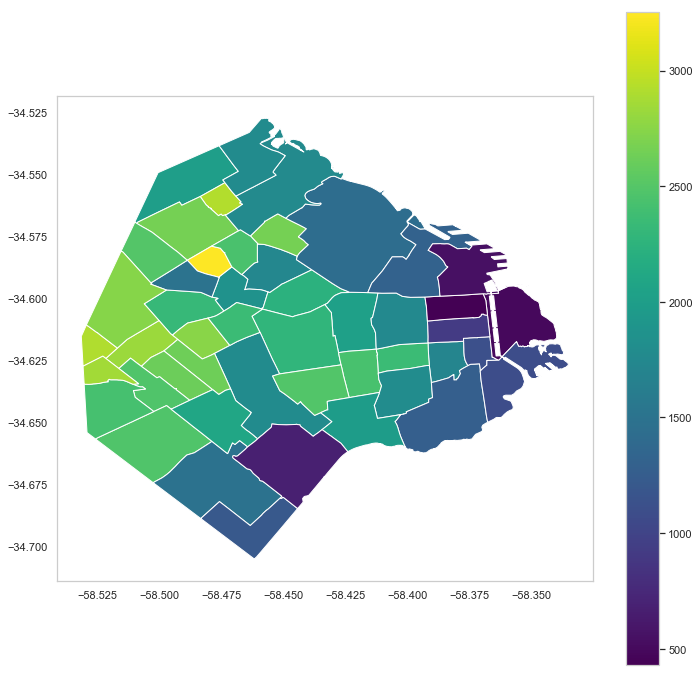

In [71]:
fig, ax = plt.subplots(figsize=(12,12))
ax.set_aspect('equal')
barrios.plot(ax=ax, column='Densidad', cmap='viridis', legend=True)
plt.show();

Podemos observar por area que barrio es mas verde. Coghlan, V Ortuzar, Devoto, Montecastro 

# Cantidad de arboles por comuna

In [72]:
df.comuna.unique()

array([ 1,  2,  3,  4,  5, 12,  6,  7, 10,  9, 11, 15, 14, 13,  8],
      dtype=int64)

In [73]:
print("TOP 5 de comunas mas arboladas:\n\n", df.comuna.value_counts(ascending=False).head(5))

TOP 5 de comunas mas arboladas:

 9     38831
12    37541
11    36413
10    34035
4     32151
Name: comuna, dtype: int64


Comunas más arboladas:

- Comuna 9: Parque Avellaneda, Liniers y Mataderos
- Comuna 12: Coghland, Saavedra, Villa Pueyrredon y Villa Urquiza
- Comuna 11: Villa General Mitre, Villa Devoto, Villa Santa Rita  y Villa del Parque.

In [74]:
comunas = df.comuna.unique()
comunas.sort()

for i in comunas:
    print("Comuna", i)
    print("---------")
    
    df_comuna = df[df['comuna'] == i][['barrio', 'nombre_comun']].\
            sort_values(by='nombre_comun', ascending=False)
    
    counts = df_comuna['nombre_comun'].value_counts(normalize=True)*100
    print(counts.head(5))
    
    print()
    

Comuna 1
---------
Fresno americano    35.115272
Plátano             14.459229
Jacarandá           13.468977
Tilo                 5.283924
Ficus                4.603125
Name: nombre_comun, dtype: float64

Comuna 2
---------
Fresno americano    37.066501
Ficus               11.597265
Plátano             11.547545
Jacarandá            7.955252
Tilo                 5.941579
Name: nombre_comun, dtype: float64

Comuna 3
---------
Fresno americano                              61.776527
Ficus                                          7.242765
Plátano                                        5.136656
Fresno (Fresno común)                          4.099678
Ligustro disciplinado (Ligustro variegado)     3.898714
Name: nombre_comun, dtype: float64

Comuna 4
---------
Fresno americano    50.377904
Plátano              7.514541
Paraíso              6.422817
Ficus                4.127399
Tipa blanca          3.480452
Name: nombre_comun, dtype: float64

Comuna 5
---------
Fresno americano         47.222